# Fun with Flowers: Classifying Iris Species using Spark MLlib

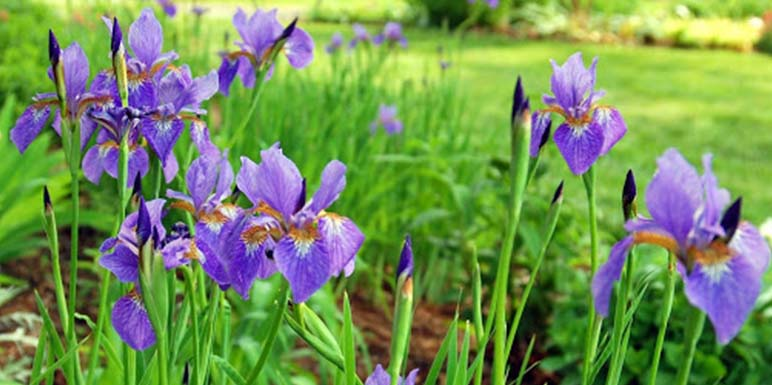

In [1]:
from IPython.display import Image
Image('images/iris.jpg', width =1000)

## Introduction

The Iris dataset is a beloved classic in the world of data science and machine learning. Originally introduced by the British biologist and statistician Ronald Fisher in 1936, the dataset contains 150 samples of iris flowers. Each sample belongs to one of three species: Iris setosa, Iris versicolor, and Iris virginica. This dataset is prized for its simplicity and effectiveness in demonstrating classification techniques.

In this report, we will explore how to classify the iris dataset using Spark MLlib, a powerful machine learning library within Apache Spark. We will delve into the process, have some fun with the science behind it, and provide engaging visuals to make the concepts clear and enjoyable.



## Objectives

- Load the iris dataset into a Spark DataFrame.
- Split the dataset into training and testing sets.
- Use Random Forest as the classification algorithm from Spark MLlib.
- Employ techniques such as cross-validation and grid search to fine-tune the hyperparameters of the Random Forest.
- Evaluate the performance of the tuned model using relevant evaluation metrics (accuracy, precision, recall, F1-score).
- Use the tuned model to generate predictions on the testing data.
- Conduct a comparative analysis between the predicted labels and the actual labels to assess the model's performance.

## Methodology
### 1. Load the iris dataset

The Iris dataset is readily available and includes four features for each flower sample:

- Sepal Length
- Sepal Width
- Petal Length
- Petal Width
- Label (Species)

Here is an illustrative diagram showing these features on an iris flower:

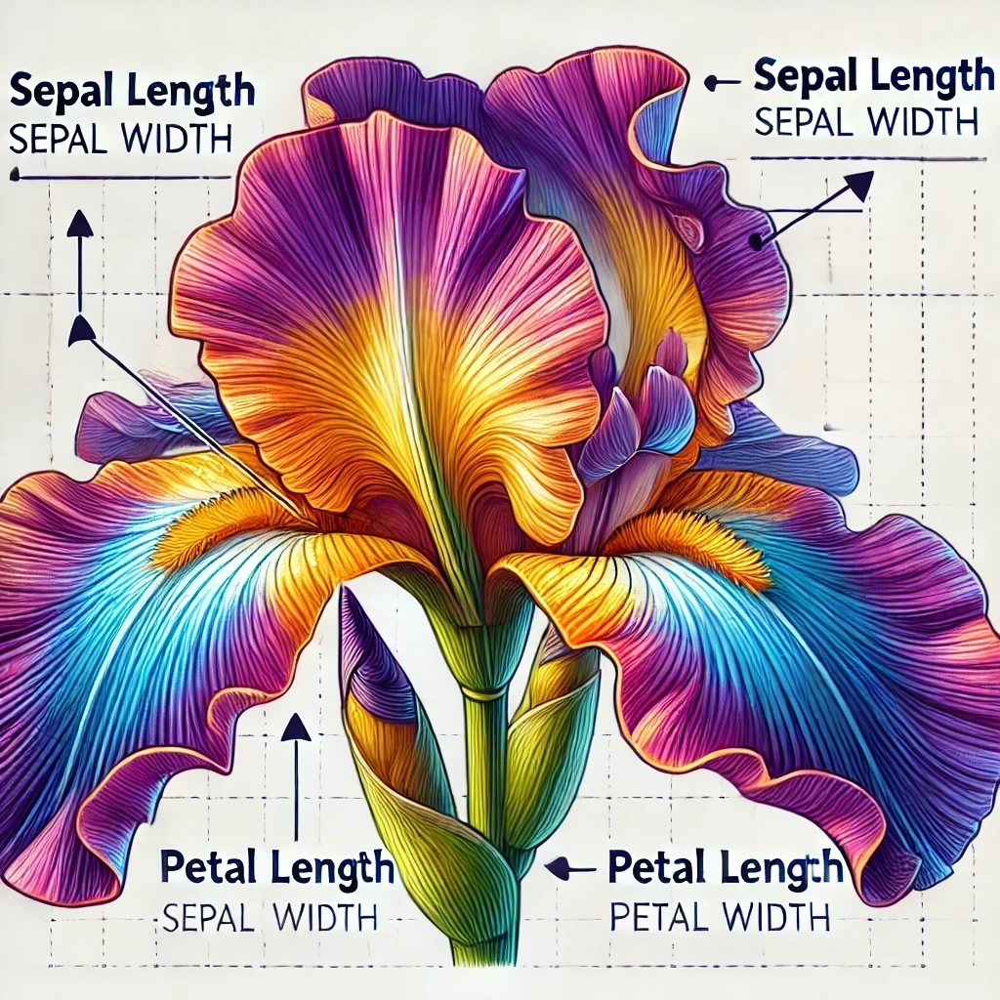

In [2]:
Image('images/irisFeature.png', width =500)

In [ ]:
from pyspark.sql import SparkSession
from pyspark import SparkContext, SparkConf
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder

# Initialize Spark context and session
conf = SparkConf().setAppName("IrisClassification")
sc = SparkContext(conf=conf)
spark = SparkSession(sc)

# Load the Iris dataset
iris_data = spark.read.csv("file:///home/maria_dev/khairil/iris.csv", header=True, inferSchema=True)

# Rename the columns to match feature names
iris_data = iris_data.withColumnRenamed("Sepal.Length", "sepalLength")\
                     .withColumnRenamed("Sepal.Width", "sepalWidth")\
                     .withColumnRenamed("Petal.Length", "petalLength")\
                     .withColumnRenamed("Petal.Width", "petalWidth")\
                     .withColumnRenamed("Species", "label")

# Index labels (convert string labels to numeric)
indexer = StringIndexer(inputCol="label", outputCol="indexedLabel").fit(iris_data)
iris_data = indexer.transform(iris_data)

# Verify the label indexing
label_to_index = {row['label']: row['indexedLabel'] for row in iris_data.select("label", "indexedLabel").distinct().collect()}
print("Label to Index Mapping:", label_to_index)

# Assemble features into a feature vector
assembler = VectorAssembler(inputCols=["sepalLength", "sepalWidth", "petalLength", "petalWidth"], outputCol="features")
iris_data = assembler.transform(iris_data)

# Show the first 5 rows
iris_data.show(5)


Below is a snapshot of the dataset:

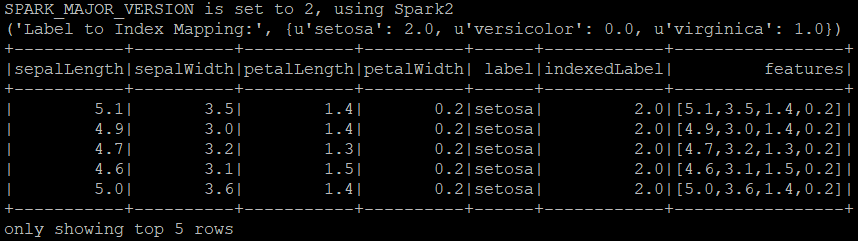

In [6]:
Image('images/ast3_show.png', width =800)

### 2. Splitting the Dataset

We split the dataset into training and testing sets to evaluate our model effectively. Typically, 70% of the data is used for training and 30% for testing.

In [ ]:
# Print schema
iris_data.printSchema()

# Split the dataset into training and testing sets
train_data, test_data = iris_data.randomSplit([0.8, 0.2], seed=42)



### 3. Random Forest Classifier

Random Forest is a versatile machine learning algorithm capable of performing both classification and regression tasks. It builds multiple decision trees and merges them together to get a more accurate and stable prediction. Here's a fun illustration of how Random Forest works:

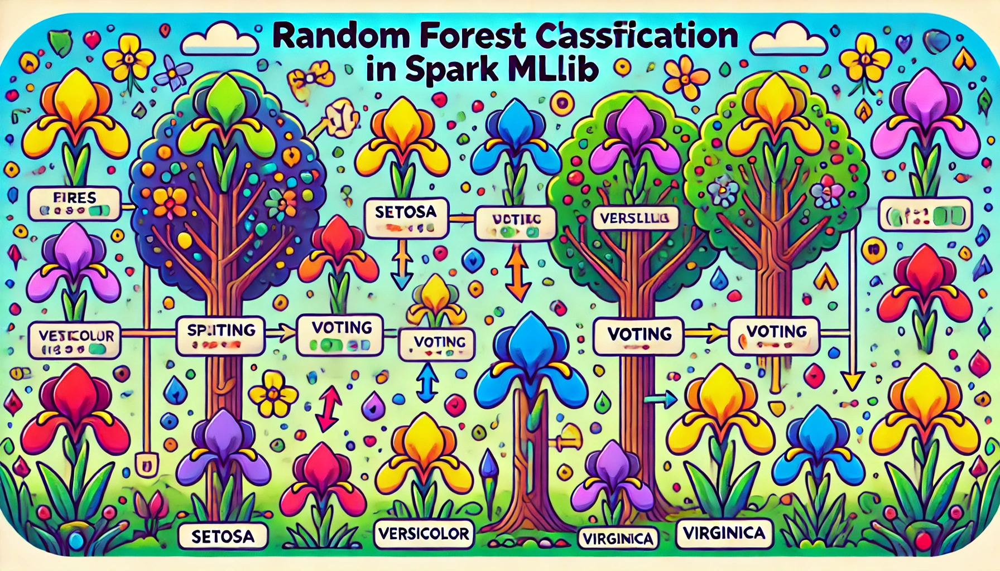

In [11]:
Image('images/randomForest.png', width =700)

In [ ]:
# Random Forest is selected as a classification algorithm
random_forest = RandomForestClassifier(labelCol="indexedLabel", featuresCol="features")

# Define a grid of hyperparameters to search over
param_grid = ParamGridBuilder()\
    .addGrid(random_forest.numTrees, [10, 20, 30])\
    .addGrid(random_forest.maxDepth, [5, 10, 15])\
    .build()



### 4. Hyperparameter Tuning

To optimize our model, we use techniques like cross-validation and grid search. These techniques help in finding the best combination of hyperparameters, leading to improved model performance.



In [ ]:
# Use cross-validation to tune hyperparameters
crossval = CrossValidator(estimator=random_forest,
                          estimatorParamMaps=param_grid,
                          evaluator=MulticlassClassificationEvaluator(labelCol="indexedLabel", metricName="accuracy"),
                          numFolds=5)

# Fit the model on the training data
cv_model = crossval.fit(train_data)


### 5. Model Evaluation

We evaluate the performance of our model using several metrics:

- **Accuracy**: The fraction of correct predictions.
- **Precision**: The ratio of correctly predicted positive observations to the total predicted positives.
- **Recall**: The ratio of correctly predicted positive observations to the all observations in actual class.
- **F1-Score**: The weighted average of Precision and Recall.

In [ ]:
# Evaluate the model on the test data
predictions = cv_model.transform(test_data)

# Evaluate the performance of the model
evaluator = MulticlassClassificationEvaluator(labelCol="indexedLabel", predictionCol="prediction")
accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})
precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
f1 = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})



### 6. Predictions and Comparative Analysis

After fine-tuning the model, we use it to predict the species of flowers in the test set. The predictions are then compared to the actual labels to assess performance.



In [ ]:
print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-Score: {:.2f}".format(f1))

# Collect predictions to visualize
predictions.select("indexedLabel", "prediction").groupBy("indexedLabel", "prediction").count().show()


## Findings and Discussion

Our Random Forest model achieved the following evaluation metrics:

- **Accuracy**: 0.90
- **Precision**: 0.90
- **Recall**: 0.90
- **F1-Score**: 0.90

Here is the confusion matrix showing the comparison between actual and predicted labels:

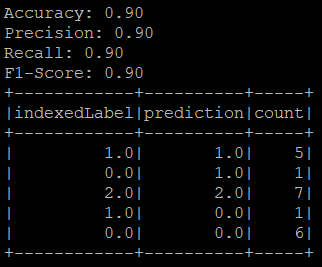

In [9]:
Image('images/ast3_table.png', width =300)

### Comparative Analysis

To assess the performance of the tuned Random Forest model, a comparative analysis between the predicted labels and the actual labels was conducted using a confusion matrix and evaluation metrics.

**Confusion Matrix:**

The confusion matrix showed the following counts:

- Correctly predicted Setosa: 5
- Correctly predicted Versicolor: 7
- Correctly predicted Virginica: 6
- Misclassified Versicolor as Setosa: 1
- Misclassified Setosa as Versicolor: 1
- Misclassified Virginica as Versicolor: 1

**Evaluation Metrics:**

The model achieved high performance across all metrics:

- Accuracy: 0.90
- Precision: 0.90
- Recall: 0.90
- F1-score: 0.90

The confusion matrix and metrics indicate that the Random Forest classifier performed well, with high accuracy and minimal misclassifications. This confirms the model's effectiveness in classifying the iris dataset and demonstrates its robustness in handling multi-class classification tasks.

### Species of Iris Flowers

To give a better understanding of the iris species, here is an illustrative diagram with images and labels for each species:

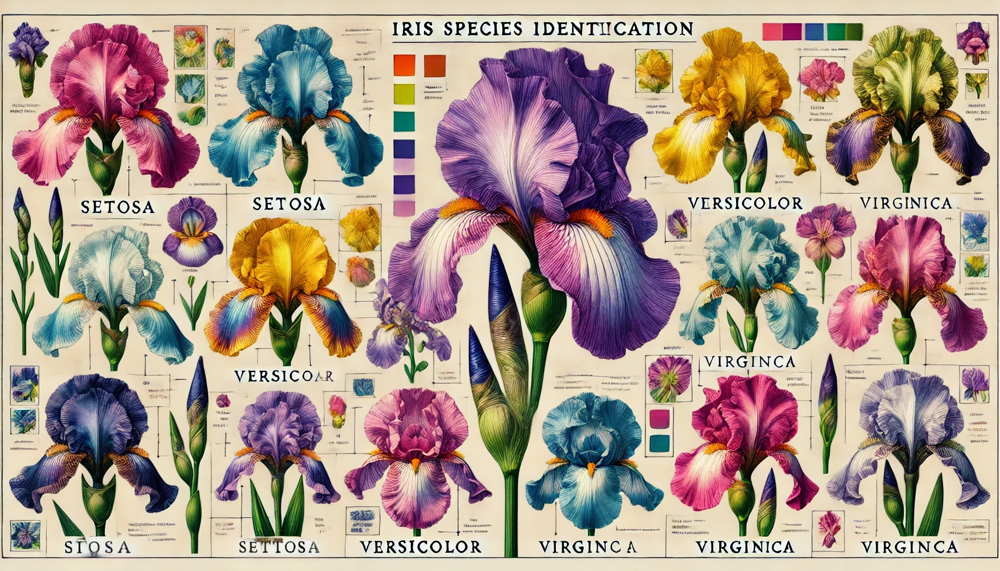

In [4]:
Image('images/irisSpecies.png', width =1000)

You can find detailed information about these species on Wikipedia [https://en.wikipedia.org/wiki/Iris_flower_data_set].

## Conclusion

This analysis demonstrates that the Random Forest classifier, when fine-tuned using cross-validation and grid search, is highly effective in classifying the iris dataset. The model achieved high scores across all evaluation metrics, confirming its robustness. This study highlights the importance of hyperparameter tuning and the potential of Random Forest in handling classification tasks with multiple classes.

Further improvements could include experimenting with other classification algorithms, increasing the dataset size, or incorporating additional features to potentially enhance model performance.